## **Trabajo Práctico 1 - Panorámica**

In [26]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [27]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [28]:
from utils import achicar, aplicar_anms, obtener_matches_cross_check, obtener_matches_flann_lowe, resumen_matches

In [29]:
# Instalamos el paquete de utilidades
!pip install -qq git+https://github.com/udesa-vision/i308-utils.git

from i308_utils import imshow, show_images

#### *Carga de imagenes*

In [30]:
imagenes_cuadro = ['inputs/cuadro_0.jpg', 'inputs/cuadro_1.jpg', 'inputs/cuadro_2.jpg']
imagenes_udesa = ['inputs/udesa_0.jpg', 'inputs/udesa_1.jpg', 'inputs/udesa_2.jpg']

### *Detección de keypoints*

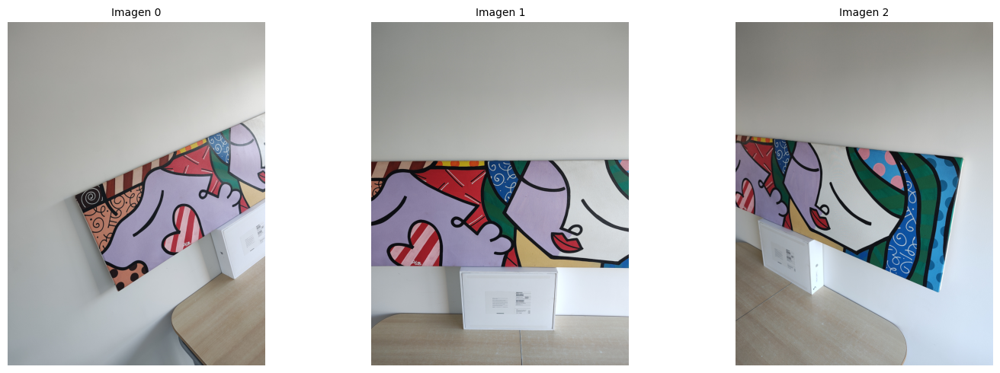

In [31]:
img0_cuadro_color = achicar(cv2.imread(imagenes_cuadro[0]))
img1_cuadro_color = achicar(cv2.imread(imagenes_cuadro[1]))
img2_cuadro_color = achicar(cv2.imread(imagenes_cuadro[2]))

show_images([img0_cuadro_color, img1_cuadro_color, img2_cuadro_color], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(15,5))

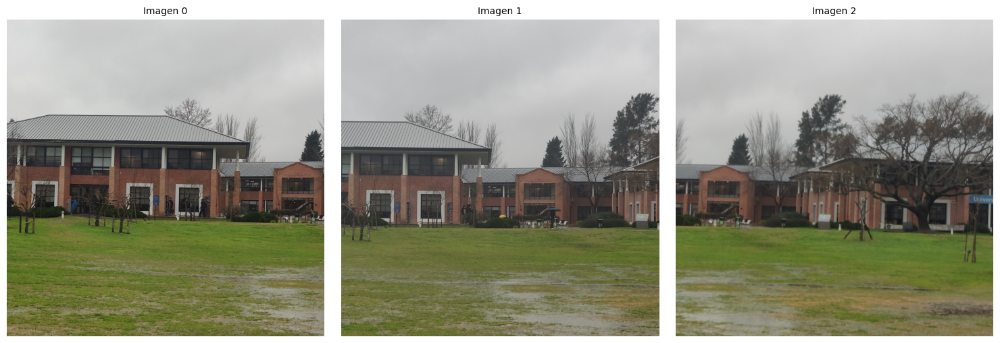

In [32]:
img0_udesa_color = achicar(cv2.imread(imagenes_udesa[0]))
img1_udesa_color = achicar(cv2.imread(imagenes_udesa[1]))
img2_udesa_color = achicar(cv2.imread(imagenes_udesa[2]))

show_images([img0_udesa_color, img1_udesa_color, img2_udesa_color], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(15, 5))

In [33]:
# SIFT trabaja sobre gradientes de intensidad, por eso usamos escala de grises
img0_cuadro_gray = cv2.cvtColor(img0_cuadro_color, cv2.COLOR_BGR2GRAY)
img1_cuadro_gray = cv2.cvtColor(img1_cuadro_color, cv2.COLOR_BGR2GRAY)
img2_cuadro_gray = cv2.cvtColor(img2_cuadro_color, cv2.COLOR_BGR2GRAY)

In [34]:
img0_udesa_gray = cv2.cvtColor(img0_udesa_color, cv2.COLOR_BGR2GRAY)
img1_udesa_gray = cv2.cvtColor(img1_udesa_color, cv2.COLOR_BGR2GRAY)
img2_udesa_gray = cv2.cvtColor(img2_udesa_color, cv2.COLOR_BGR2GRAY)

In [35]:
# Creamos el detector de homografias SIFT entre las dos primeras imágenes
sift = cv2.SIFT_create()

In [36]:
# Detectamos keypoints y computamos los descriptores
keypoints0_cuadro, des0_cuadro = sift.detectAndCompute(img0_cuadro_gray, None)
keypoints1_cuadro, des1_cuadro = sift.detectAndCompute(img1_cuadro_gray, None)
keypoints2_cuadro, des2_cuadro = sift.detectAndCompute(img2_cuadro_gray, None)

keypoints0_udesa, des0_udesa = sift.detectAndCompute(img0_udesa_gray, None)
keypoints1_udesa, des1_udesa = sift.detectAndCompute(img1_udesa_gray, None)
keypoints2_udesa, des2_udesa = sift.detectAndCompute(img2_udesa_gray, None)

print('CUADRO')
print(f' largo keypoints0: {len(keypoints0_cuadro)}, largo keypoints1: {len(keypoints1_cuadro)}, largo keypoints2: {len(keypoints2_cuadro)}')
print('UDESA')
print(f' largo keypoints0: {len(keypoints0_udesa)}, largo keypoints1: {len(keypoints1_udesa)}, largo keypoints2: {len(keypoints2_udesa)}')

CUADRO
 largo keypoints0: 481, largo keypoints1: 450, largo keypoints2: 490
UDESA
 largo keypoints0: 3120, largo keypoints1: 3038, largo keypoints2: 2756


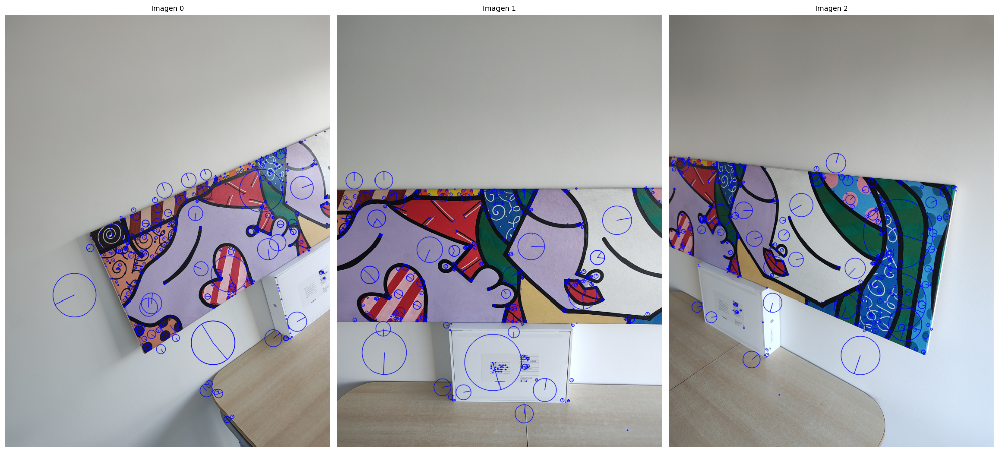

In [37]:
keypoints_img0_cuadro = cv2.drawKeypoints(img0_cuadro_color, keypoints0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints_img1_cuadro = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints_img2_cuadro = cv2.drawKeypoints(img2_cuadro_color, keypoints2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([keypoints_img0_cuadro, keypoints_img1_cuadro, keypoints_img2_cuadro], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(20, 10))

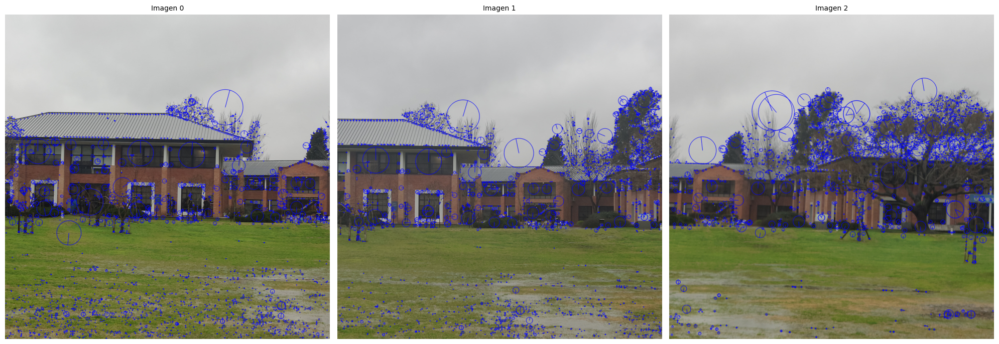

In [38]:
keypoints_img0_udesa = cv2.drawKeypoints(img0_udesa_color, keypoints0_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
keypoints_img1_udesa = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
keypoints_img2_udesa = cv2.drawKeypoints(img2_udesa_color, keypoints2_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([keypoints_img0_udesa, keypoints_img1_udesa, keypoints_img2_udesa], titles = ['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(20,10))

### *Supresión de No-Máxima Adaptativa*

In [39]:
n_deseados = 200

keypoints0_cuadro_anms, des0_cuadro_anms = aplicar_anms(keypoints0_cuadro, des0_cuadro, n_deseados)
keypoints1_cuadro_anms, des1_cuadro_anms = aplicar_anms(keypoints1_cuadro, des1_cuadro, n_deseados)
keypoints2_cuadro_anms, des2_cuadro_anms = aplicar_anms(keypoints2_cuadro, des2_cuadro, n_deseados)

print(f'Antes: {len(keypoints0_cuadro)}, Después: {len(keypoints0_cuadro_anms)}')
print(f'Antes: {len(keypoints1_cuadro)}, Después: {len(keypoints1_cuadro_anms)}')
print(f'Antes: {len(keypoints2_cuadro)}, Después: {len(keypoints2_cuadro_anms)}')

Antes: 481, Después: 200
Antes: 450, Después: 200
Antes: 490, Después: 200


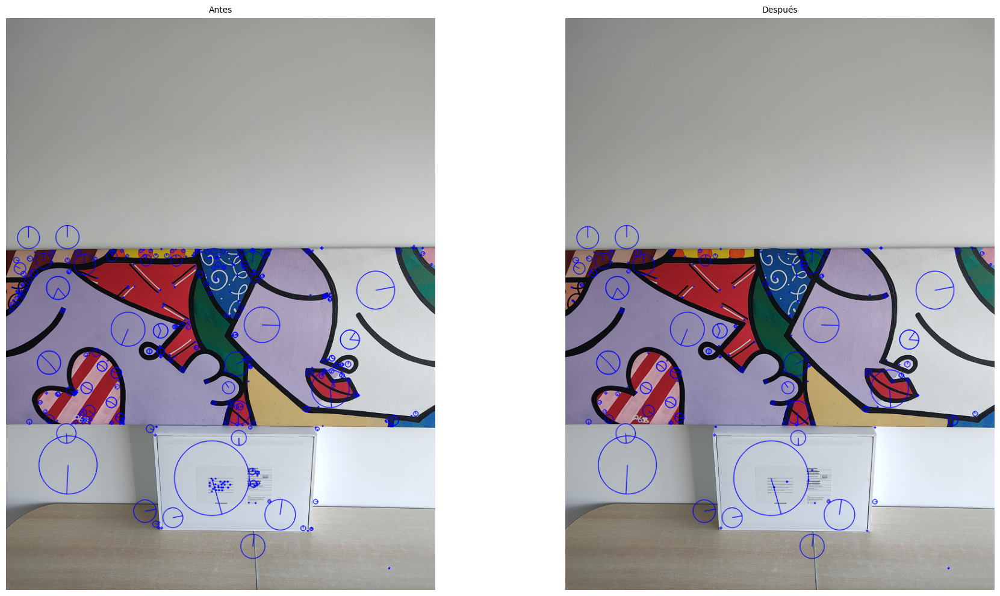

In [40]:
imagen1_cuadro_antes = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imagen1_cuadro_despues = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([imagen1_cuadro_antes, imagen1_cuadro_despues], titles = ['Antes', 'Después'], figsize=(20,10))

In [41]:
n_deseados_udesa = 500

keypoints0_udesa_anms, des0_udesa_anms = aplicar_anms(keypoints0_udesa, des0_udesa, n_deseados_udesa)
keypoints1_udesa_anms, des1_udesa_anms = aplicar_anms(keypoints1_udesa, des1_udesa, n_deseados_udesa)
keypoints2_udesa_anms, des2_udesa_anms = aplicar_anms(keypoints2_udesa, des2_udesa, n_deseados_udesa)

print(f'Antes: {len(keypoints0_udesa)}, Después: {len(keypoints0_udesa_anms)}')
print(f'Antes: {len(keypoints1_udesa)}, Después: {len(keypoints1_udesa_anms)}')
print(f'Antes: {len(keypoints2_udesa)}, Después: {len(keypoints2_udesa_anms)}')

Antes: 3120, Después: 500
Antes: 3038, Después: 500
Antes: 2756, Después: 500


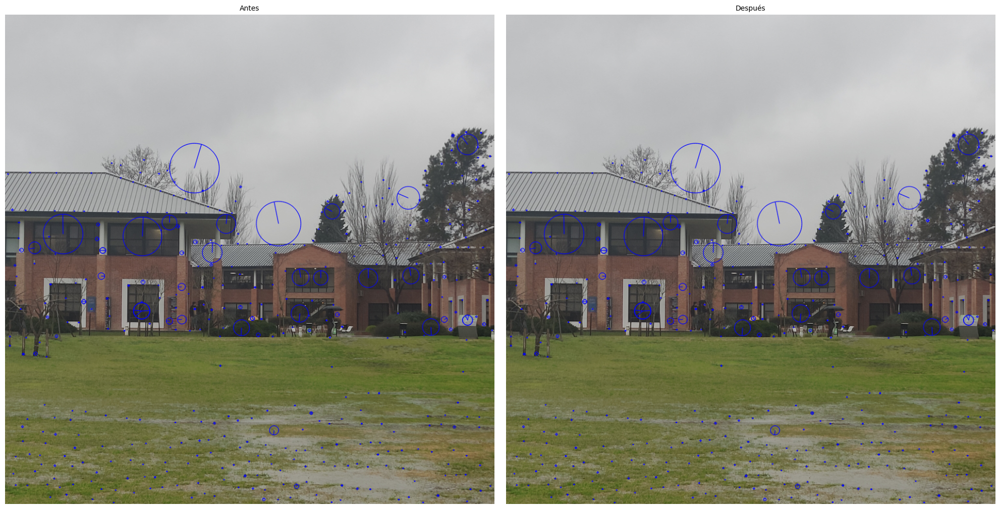

In [42]:
imagen1_udesa_antes = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imagen1_udesa_despues = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([imagen1_udesa_antes, imagen1_udesa_despues], titles = ['Antes', 'Después'], figsize=(20,10))

### *Asociación de características (Matching)*

Para eset paso, utilizaremos las imagenes 1 como anclas, ya que son las que deberían ir al medio de la imagen completa

#### **Cross Check**

In [43]:
# Usando la imagen 1 como ancla...
matches_0_1_cuadro_cc = obtener_matches_cross_check(des0_cuadro_anms, des1_cuadro_anms)
matches_2_1_cuadro_cc = obtener_matches_cross_check(des2_cuadro_anms, des1_cuadro_anms)

matches_0_1_udesa_cc = obtener_matches_cross_check(des0_udesa_anms, des1_udesa_anms)
matches_2_1_udesa_cc = obtener_matches_cross_check(des2_udesa_anms, des1_udesa_anms)

print("CUADRO")
print(f"Matches 0 -> 1: {len(matches_0_1_cuadro_cc)}")
print(f"Matches 2 -> 1: {len(matches_2_1_cuadro_cc)}")

print("UDESA")
print(f"Matches 0 -> 1: {len(matches_0_1_udesa_cc)}")
print(f"Matches 2 -> 1: {len(matches_2_1_udesa_cc)}")

CUADRO
Matches 0 -> 1: 84
Matches 2 -> 1: 74
UDESA
Matches 0 -> 1: 186
Matches 2 -> 1: 168


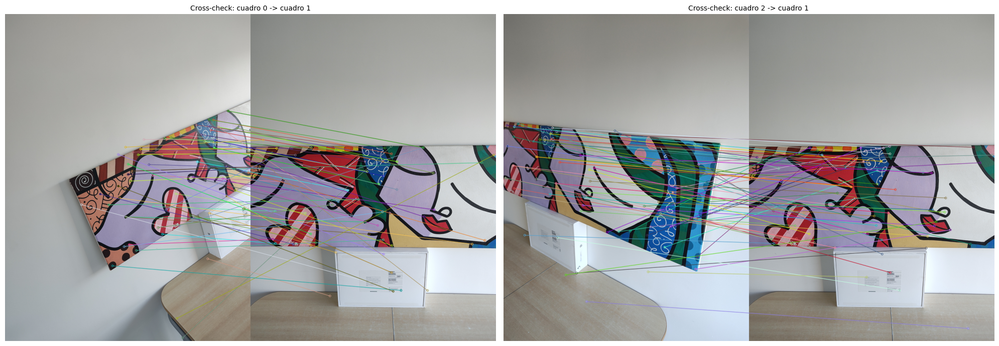

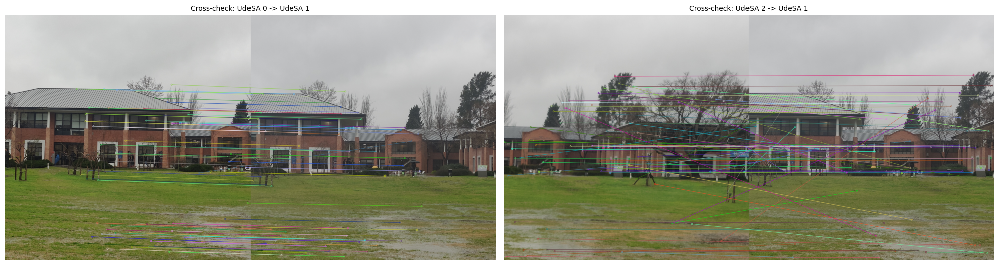

In [44]:
# Visualizamos

# Cuadro
matches_a_mostrar = 80

img_matches_0_1_cuadro_cc = cv2.drawMatches(img0_cuadro_color, keypoints0_cuadro_anms, img1_cuadro_color,
                                            keypoints1_cuadro_anms, matches_0_1_cuadro_cc[:matches_a_mostrar], None,
                                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_cuadro_cc = cv2.drawMatches(img2_cuadro_color, keypoints2_cuadro_anms, img1_cuadro_color,
                                            keypoints1_cuadro_anms, matches_2_1_cuadro_cc[:matches_a_mostrar], None,
                                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_cuadro_cc, img_matches_2_1_cuadro_cc], titles=["Cross-check: cuadro 0 -> cuadro 1", "Cross-check: cuadro 2 -> cuadro 1"], figsize=(20, 8))


# Udesa
img_matches_0_1_udesa_cc = cv2.drawMatches(img0_udesa_color, keypoints0_udesa_anms, img1_udesa_color,
                                           keypoints1_udesa_anms, matches_0_1_udesa_cc[:matches_a_mostrar], None,
                                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_udesa_cc = cv2.drawMatches(img2_udesa_color, keypoints2_udesa_anms, img1_udesa_color,
                                           keypoints1_udesa_anms, matches_2_1_udesa_cc[:matches_a_mostrar], None,
                                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_udesa_cc, img_matches_2_1_udesa_cc], titles=["Cross-check: UdeSA 0 -> UdeSA 1", "Cross-check: UdeSA 2 -> UdeSA 1"], figsize=(20, 8))

#### **FLANN + Lowe Ratio**

In [45]:
matches_0_1_cuadro_flann = obtener_matches_flann_lowe(des0_cuadro_anms, des1_cuadro_anms, ratio=0.75)
matches_2_1_cuadro_flann = obtener_matches_flann_lowe(des2_cuadro_anms, des1_cuadro_anms, ratio=0.75)

matches_0_1_udesa_flann = obtener_matches_flann_lowe(des0_udesa_anms, des1_udesa_anms, ratio=0.75)
matches_2_1_udesa_flann = obtener_matches_flann_lowe(des2_udesa_anms, des1_udesa_anms, ratio=0.75)

print("CUADRO")
print(f"Matches 0 -> 1: {len(matches_0_1_cuadro_flann)}")
print(f"Matches 2 -> 1: {len(matches_2_1_cuadro_flann)}")

print("UDESA")
print(f"Matches 0 -> 1: {len(matches_0_1_udesa_flann)}")
print(f"Matches 2 -> 1: {len(matches_2_1_udesa_flann)}")

CUADRO
Matches 0 -> 1: 52
Matches 2 -> 1: 34
UDESA
Matches 0 -> 1: 114
Matches 2 -> 1: 45


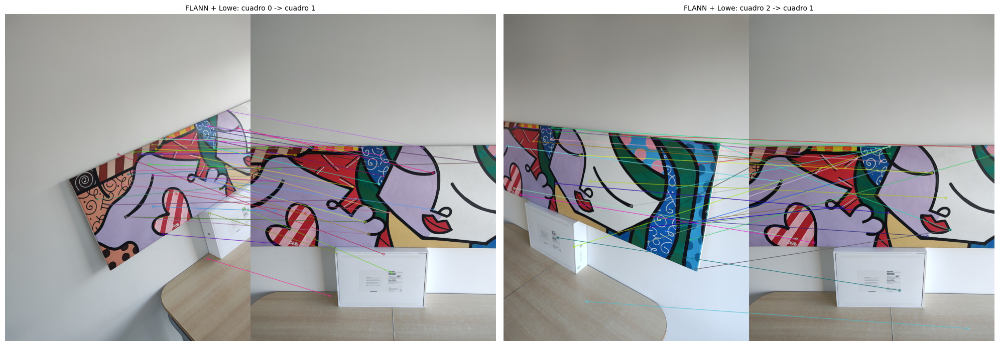

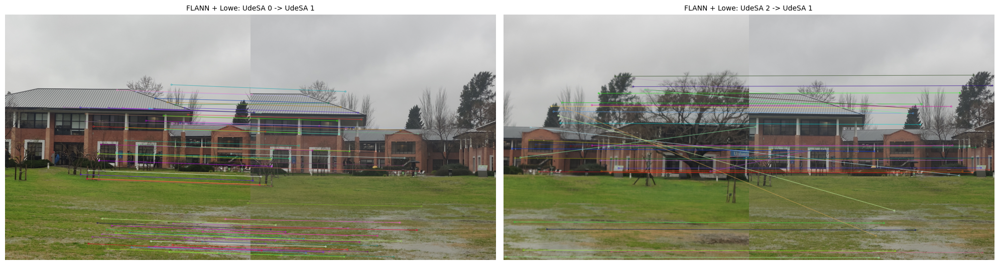

In [46]:
# Visualizamos

# Cuadro
matches_a_mostrar = 80

img_matches_0_1_cuadro_flann = cv2.drawMatches(img0_cuadro_color, keypoints0_cuadro_anms,
                                               img1_cuadro_color, keypoints1_cuadro_anms, matches_0_1_cuadro_flann[:matches_a_mostrar], 
                                               None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_cuadro_flann = cv2.drawMatches( img2_cuadro_color, keypoints2_cuadro_anms, img1_cuadro_color, 
                                               keypoints1_cuadro_anms, matches_2_1_cuadro_flann[:matches_a_mostrar],
                                               None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images( [img_matches_0_1_cuadro_flann, img_matches_2_1_cuadro_flann], titles=["FLANN + Lowe: cuadro 0 -> cuadro 1", "FLANN + Lowe: cuadro 2 -> cuadro 1"], figsize=(20, 8))

# udesa
img_matches_0_1_udesa_flann = cv2.drawMatches(img0_udesa_color, keypoints0_udesa_anms, img1_udesa_color,
                                              keypoints1_udesa_anms, matches_0_1_udesa_flann[:matches_a_mostrar],
                                              None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_udesa_flann = cv2.drawMatches(img2_udesa_color, keypoints2_udesa_anms, img1_udesa_color,
                                              keypoints1_udesa_anms, matches_2_1_udesa_flann[:matches_a_mostrar],
                                              None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_udesa_flann, img_matches_2_1_udesa_flann], titles=["FLANN + Lowe: UdeSA 0 -> UdeSA 1", "FLANN + Lowe: UdeSA 2 -> UdeSA 1"], figsize=(20, 8))

#### **Comparando**

In [47]:
resumen_matches(matches_0_1_udesa_cc, "Cross-check UdeSA 0 -> 1")
resumen_matches(matches_2_1_udesa_cc, "Cross-check UdeSA 2 -> 1")

resumen_matches(matches_0_1_udesa_flann, "FLANN + Lowe UdeSA 0 -> 1")
resumen_matches(matches_2_1_udesa_flann, "FLANN + Lowe UdeSA 2 -> 1")

Cross-check UdeSA 0 -> 1
Cantidad: 186
Distancia media: 177.16
Distancia mediana: 176.21
Distancia mínima: 20.12
Distancia máxima: 385.45

Cross-check UdeSA 2 -> 1
Cantidad: 168
Distancia media: 241.34
Distancia mediana: 253.85
Distancia mínima: 51.09
Distancia máxima: 375.66

FLANN + Lowe UdeSA 0 -> 1
Cantidad: 114
Distancia media: 118.13
Distancia mediana: 108.87
Distancia mínima: 20.12
Distancia máxima: 273.97

FLANN + Lowe UdeSA 2 -> 1
Cantidad: 45
Distancia media: 155.09
Distancia mediana: 148.95
Distancia mínima: 51.09
Distancia máxima: 283.47



ELEGIR CON CUAL ME QUEDO --> FLANNNN 

### *Estimación de la homografía “manualmente"*